In [163]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

### Reading and Understanding Data

In [164]:
Property=pd.read_csv('D://Upgrad//Advanced Regression//Advanced-RegressionAssignment//train.csv')
Property.head()# top rows of the table
#Property.info()#info. of non null elements and data type of each variable
#Property.shape #no. of rows and columns
#Property.describe() #count of each variable, mean, min. and max. values, standard deviation

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65,8450,Pave,NF,Reg,Lvl,AllPub,...,0,NP,NF,NMF,0,2,2008,WD,Normal,208500
1,2,20,RL,80,9600,Pave,NF,Reg,Lvl,AllPub,...,0,NP,NF,NMF,0,5,2007,WD,Normal,181500
2,3,60,RL,68,11250,Pave,NF,IR1,Lvl,AllPub,...,0,NP,NF,NMF,0,9,2008,WD,Normal,223500
3,4,70,RL,60,9550,Pave,NF,IR1,Lvl,AllPub,...,0,NP,NF,NMF,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84,14260,Pave,NF,IR1,Lvl,AllPub,...,0,NP,NF,NMF,0,12,2008,WD,Normal,250000


In [165]:
#To remove the null values 
Property = Property.dropna(axis = 0, how ='any')
Property.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65,8450,Pave,NF,Reg,Lvl,AllPub,...,0,NP,NF,NMF,0,2,2008,WD,Normal,208500
1,2,20,RL,80,9600,Pave,NF,Reg,Lvl,AllPub,...,0,NP,NF,NMF,0,5,2007,WD,Normal,181500
2,3,60,RL,68,11250,Pave,NF,IR1,Lvl,AllPub,...,0,NP,NF,NMF,0,9,2008,WD,Normal,223500
3,4,70,RL,60,9550,Pave,NF,IR1,Lvl,AllPub,...,0,NP,NF,NMF,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84,14260,Pave,NF,IR1,Lvl,AllPub,...,0,NP,NF,NMF,0,12,2008,WD,Normal,250000


### Dropping the uninfluencial data

In [166]:
Property.drop(['Id','Alley','YearBuilt','Utilities','LandSlope','BsmtFinSF2','LowQualFinSF','BsmtHalfBath','GarageQual','GarageCond','PavedDrive','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','PoolQC','MiscFeature','MiscVal','FireplaceQu','Heating','OverallQual','Exterior1st','Exterior2nd','MasVnrType','YearRemodAdd','Condition1'], axis = 1, inplace = True)
Property.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,Neighborhood,Condition2,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65,8450,Pave,Reg,Lvl,Inside,CollgCr,Norm,...,2,548,0,61,NF,2,2008,WD,Normal,208500
1,20,RL,80,9600,Pave,Reg,Lvl,FR2,Veenker,Norm,...,2,460,298,0,NF,5,2007,WD,Normal,181500
2,60,RL,68,11250,Pave,IR1,Lvl,Inside,CollgCr,Norm,...,2,608,0,42,NF,9,2008,WD,Normal,223500
3,70,RL,60,9550,Pave,IR1,Lvl,Corner,Crawfor,Norm,...,3,642,0,35,NF,2,2006,WD,Abnorml,140000
4,60,RL,84,14260,Pave,IR1,Lvl,FR2,NoRidge,Norm,...,3,836,192,84,NF,12,2008,WD,Normal,250000


### Preparing Categorical data


In [167]:
# visualizing the categorical data, number of attributes for each categorical variable
#for OverallCond, 1-->Very Poor,2-->Poor,3-->Fair,4-->Below Average, 5-->Average, 6-->Above Average, 7-->Good, 8-->Very Good, 9-->Excellent, 10-->Very Excellent
Property.loc[(Property['OverallCond']==1),'OverallCond']='Very Poor'
Property.loc[(Property['OverallCond']==2),'OverallCond']='Poor'
Property.loc[(Property['OverallCond']==3),'OverallCond']='Fair'
Property.loc[(Property['OverallCond']==4),'OverallCond']='Below Average'
Property.loc[(Property['OverallCond']==5),'OverallCond']='Average'
Property.loc[(Property['OverallCond']==6),'OverallCond']='Above Average'
Property.loc[(Property['OverallCond']==7),'OverallCond']='Good'
Property.loc[(Property['OverallCond']==8),'OverallCond']='Very Good'
Property.loc[(Property['OverallCond']==9),'OverallCond']='Excellent'
Property.loc[(Property['OverallCond']==10),'OverallCond']='Very Excellent'
Property['OverallCond'].astype('category').value_counts()

Average          788
Above Average    236
Good             187
Very Good         68
Below Average     51
Excellent         20
Fair              18
Poor               3
Name: OverallCond, dtype: int64

In [70]:
#for YearBuilt, 1872 to 1912-->Longback,1913 to 1952-->Very Old,1953 to 1992-->Old,1993 to 2010-->Recent, 
#Property.loc[(Property['YearBuilt']>=1872) & (Property['YearBuilt']<=1912),'YearBuilt']='Longback'
#Property.loc[(Property['YearBuilt']>=1913) & (Property['YearBuilt']<=1952 ),'YearBuilt']='Very Old'
#Property.loc[(Property['YearBuilt']>=1953) & (Property['YearBuilt']<=1992 ),'YearBuilt']='Old'
#Property.loc[(Property['YearBuilt']>=1993) & (Property['YearBuilt']<=2010 ),'YearBuilt']='Recent'
#Property['YearBuilt'].astype('category').value_counts()


In [168]:
#keeping categorical representations for MoSold
Property.loc[(Property['MoSold']==1),'MoSold']='Jan'
Property.loc[(Property['MoSold']==2),'MoSold']='Feb'
Property.loc[(Property['MoSold']==3),'MoSold']='Mar'
Property.loc[(Property['MoSold']==4),'MoSold']='April'
Property.loc[(Property['MoSold']==5),'MoSold']='May'
Property.loc[(Property['MoSold']==6),'MoSold']='June'
Property.loc[(Property['MoSold']==7),'MoSold']='July'
Property.loc[(Property['MoSold']==8),'MoSold']='Aug'
Property.loc[(Property['MoSold']==9),'MoSold']='Sep'
Property.loc[(Property['MoSold']==10),'MoSold']='Oct'
Property.loc[(Property['MoSold']==11),'MoSold']='Nov'
Property.loc[(Property['MoSold']==12),'MoSold']='Dec'
Property['MoSold'].astype('category').value_counts()

June     243
July     223
May      191
April    131
Aug      113
Mar       95
Oct       87
Nov       76
Sep       55
Dec       53
Jan       53
Feb       51
Name: MoSold, dtype: int64

In [169]:
#keeping categorical representations for YrSold
#for YrSold, 2006-->A,2007-->B,2008-->C,2009-->D, 2010-->E
Property.loc[(Property['YrSold']==2006),'YrSold']='A'
Property.loc[(Property['YrSold']==2007),'YrSold']='B'
Property.loc[(Property['YrSold']==2008),'YrSold']='C'
Property.loc[(Property['YrSold']==2009),'YrSold']='D'
Property.loc[(Property['YrSold']==2010),'YrSold']='E'
Property['YrSold'].astype('category').value_counts()

D    322
B    310
A    298
C    278
E    163
Name: YrSold, dtype: int64

In [170]:
#keeping categorical variables in dataset
#bsharing['dteday']=bsharing['dteday'].astype('datetime64')
Property_categorical=Property.select_dtypes(exclude=['float64','int64'])
#bsharing_categorical=bsharing.select_dtypes(exclude=['float64','int64'])
print(Property_categorical.columns)

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'Neighborhood', 'Condition2', 'BldgType', 'HouseStyle', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'GarageType', 'GarageFinish', 'Fence', 'MoSold', 'YrSold', 'SaleType',
       'SaleCondition'],
      dtype='object')


In [171]:
Property_categorical
#print(Property)

,MSZoning,Street,LotShape,LandContour,LotConfig,Neighborhood,Condition2,BldgType,HouseStyle,OverallCond,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,Fence,MoSold,YrSold,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,Inside,CollgCr,Norm,1Fam,2Story,Average,...,SBrkr,Gd,Typ,Attchd,RFn,NF,Feb,C,WD,Normal
1,RL,Pave,Reg,Lvl,FR2,Veenker,Norm,1Fam,1Story,Very Good,...,SBrkr,TA,Typ,Attchd,RFn,NF,May,B,WD,Normal
2,RL,Pave,IR1,Lvl,Inside,CollgCr,Norm,1Fam,2Story,Average,...,SBrkr,Gd,Typ,Attchd,RFn,NF,Sep,C,WD,Normal
3,RL,Pave,IR1,Lvl,Corner,Crawfor,Norm,1Fam,2Story,Average,...,SBrkr,Gd,Typ,Detchd,Unf,NF,Feb,A,WD,Abnorml
4,RL,Pave,IR1,Lvl,FR2,NoRidge,Norm,1Fam,2Story,Average,...,SBrkr,Gd,Typ,Attchd,RFn,NF,Dec,C,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,Inside,Gilbert,Norm,1Fam,2Story,Average,...,SBrkr,TA,Typ,Attchd,RFn,NF,Aug,B,WD,Normal
1456,RL,Pave,Reg,Lvl,Inside,NWAmes,Norm,1Fam,1Story,Above Average,...,SBrkr,TA,Min1,Attchd,Unf,MnPrv,Feb,E,WD,Normal
1457,RL,Pave,Reg,Lvl,Inside,Crawfor,Norm,1Fam,2Story,Excellent,...,SBrkr,Gd,Typ,Attchd,RFn,GdPrv,May,E,WD,Normal
1458,RL,Pave,Reg,Lvl,Inside,NAmes,Norm,1Fam,1Story,Above Average,...,FuseA,Gd,Typ,Attchd,Unf,NF,April,E,WD,Normal


### Visualizing Categorical data

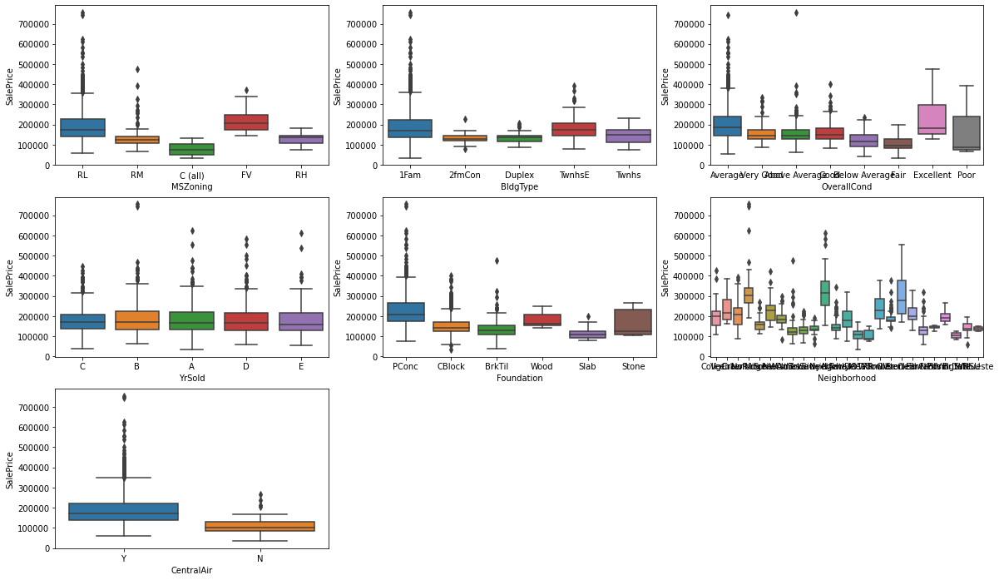

In [172]:
#visuaizing categorical variables
#continuous variable-price, categorical variables-MSZoing, BldgType, OverallCond,YrSold, Foundation, Neighborhood,CentralAir etc.,
plt.figure(figsize=(20,12))
plt.subplot(3,3,1)
sns.boxplot(x='MSZoning',y='SalePrice',data=Property)
plt.subplot(3,3,2)
sns.boxplot(x='BldgType',y='SalePrice',data=Property)
plt.subplot(3,3,3)
sns.boxplot(x='OverallCond',y='SalePrice',data=Property)
plt.subplot(3,3,4)
sns.boxplot(x='YrSold',y='SalePrice',data=Property)
plt.subplot(3,3,5)
sns.boxplot(x='Foundation',y='SalePrice',data=Property)
plt.subplot(3,3,6)
sns.boxplot(x='Neighborhood',y='SalePrice',data=Property)
plt.subplot(3,3,7)
sns.boxplot(x='CentralAir',y='SalePrice',data=Property)
plt.show()

### Preparing Numerical data

In [173]:
#Keeping all int variables at one place

Property_numeric=Property.select_dtypes(include=['float64'])
Property_numeric.head()

intvariablelist=['MSSubClass','BsmtFinSF1','GarageCars','LotFrontage','TotalBsmtSF','1stFlrSF','LotArea','MasVnrArea','GrLivArea','1stFlrSF','GarageArea','OpenPorchSF','SalePrice']
for var in intvariablelist:
    Property[var]=Property[var].astype("float")
#keeping numerical data in one set
Property_numeric=Property.select_dtypes(include=['float64'])
Property_numeric.head()
#print(bsharing)


,MSSubClass,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,GarageCars,GarageArea,OpenPorchSF,SalePrice
0,60.0,65.0,8450.0,196.0,706.0,856.0,856.0,1710.0,2003.0,2.0,548.0,61.0,208500.0
1,20.0,80.0,9600.0,0.0,978.0,1262.0,1262.0,1262.0,1976.0,2.0,460.0,0.0,181500.0
2,60.0,68.0,11250.0,162.0,486.0,920.0,920.0,1786.0,2001.0,2.0,608.0,42.0,223500.0
3,70.0,60.0,9550.0,0.0,216.0,756.0,961.0,1717.0,1998.0,3.0,642.0,35.0,140000.0
4,60.0,84.0,14260.0,350.0,655.0,1145.0,1145.0,2198.0,2000.0,3.0,836.0,84.0,250000.0


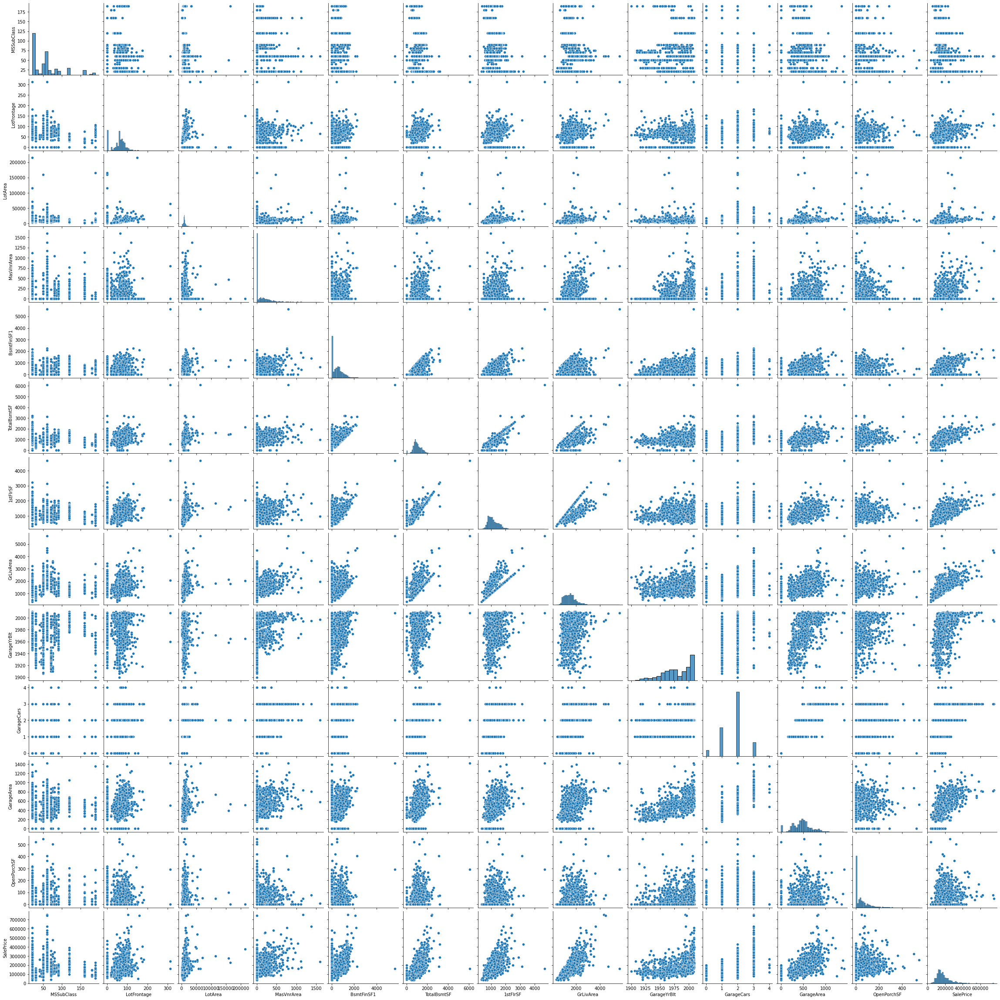

In [96]:
sns.pairplot(Property_numeric)
plt.show()

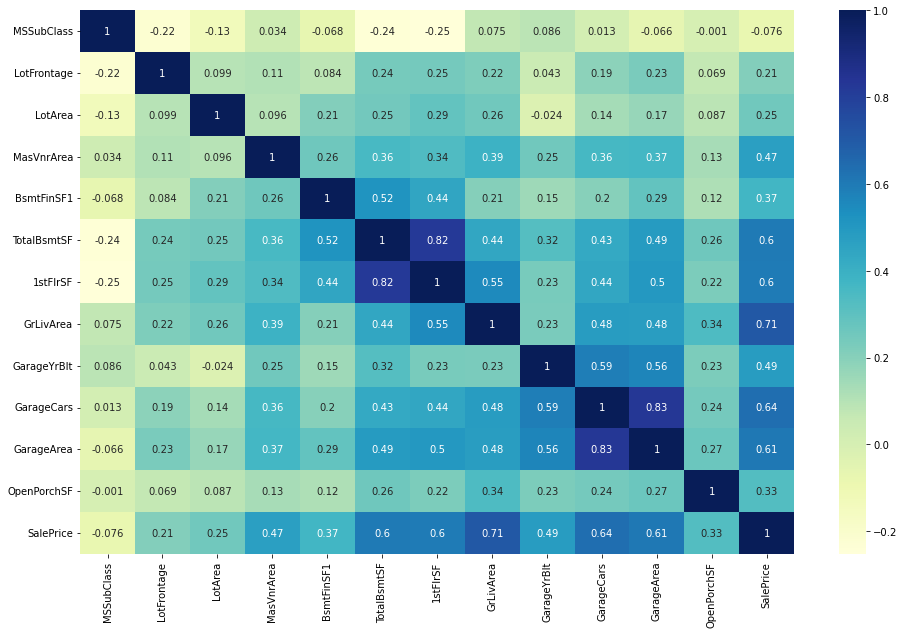

In [174]:
#heatmap of numerical variables
plt.figure(figsize = (16, 10))
sns.heatmap(Property_numeric.corr(), annot = True, cmap="YlGnBu")
plt.show()

# Observation of heatmap: as pair plots are huge, so depends on heatmap, it seen that, 
1. SalePrice is positively correlated with GrLiveArea, TotalBsmtSF, Garagecars, GarageArea and 1stFlrSF
2. TotRoomsAbvGrd is correlated with BedroomAbvGr, GrLiveArea
3. BsmtFullBath is correlated with BsmtFinSF1
4. TotalBsmtSF is correlated with 1stFlrSF
5.GarageArea and GarageCars are positively correlated
#### Hence Drop TotalBsmtSF,garagecars and BsmtFinSF1 

In [175]:
Property.drop(['TotalBsmtSF','BsmtFinSF1','GarageCars'], axis = 1, inplace = True)
Property.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,Neighborhood,Condition2,...,GarageFinish,GarageArea,WoodDeckSF,OpenPorchSF,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60.0,RL,65.0,8450.0,Pave,Reg,Lvl,Inside,CollgCr,Norm,...,RFn,548.0,0,61.0,NF,Feb,C,WD,Normal,208500.0
1,20.0,RL,80.0,9600.0,Pave,Reg,Lvl,FR2,Veenker,Norm,...,RFn,460.0,298,0.0,NF,May,B,WD,Normal,181500.0
2,60.0,RL,68.0,11250.0,Pave,IR1,Lvl,Inside,CollgCr,Norm,...,RFn,608.0,0,42.0,NF,Sep,C,WD,Normal,223500.0
3,70.0,RL,60.0,9550.0,Pave,IR1,Lvl,Corner,Crawfor,Norm,...,Unf,642.0,0,35.0,NF,Feb,A,WD,Abnorml,140000.0
4,60.0,RL,84.0,14260.0,Pave,IR1,Lvl,FR2,NoRidge,Norm,...,RFn,836.0,192,84.0,NF,Dec,C,WD,Normal,250000.0


In [176]:
#subset of all categorical variables
Property_categorical=Property.select_dtypes(include=['object'])

In [177]:
#Dummy variables
#MSZoning, BldgType, OverallCond, YrSold,Foundation,Neighborhood,CentralAir  has numericals- converting these into binary. ie., converting them to dummy variables
Property_categorical_dummies=pd.get_dummies(Property_categorical, drop_first=True)
Property_categorical_dummies.head()

,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,0
2,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


In [178]:
#concat dummy variables with original dataframe
Property=pd.concat([Property,Property_categorical_dummies],axis=1)
Property.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,Neighborhood,Condition2,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60.0,RL,65.0,8450.0,Pave,Reg,Lvl,Inside,CollgCr,Norm,...,0,0,0,0,1,0,0,0,1,0
1,20.0,RL,80.0,9600.0,Pave,Reg,Lvl,FR2,Veenker,Norm,...,0,0,0,0,1,0,0,0,1,0
2,60.0,RL,68.0,11250.0,Pave,IR1,Lvl,Inside,CollgCr,Norm,...,0,0,0,0,1,0,0,0,1,0
3,70.0,RL,60.0,9550.0,Pave,IR1,Lvl,Corner,Crawfor,Norm,...,0,0,0,0,1,0,0,0,0,0
4,60.0,RL,84.0,14260.0,Pave,IR1,Lvl,FR2,NoRidge,Norm,...,0,0,0,0,1,0,0,0,1,0


In [179]:
Property.drop(['MSZoning','LotConfig','OverallCond','Street','LotShape','LandContour','Neighborhood','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','BsmtUnfSF','HeatingQC','CentralAir','Electrical','KitchenQual','Functional','GarageType','GarageYrBlt','GarageFinish','GarageArea','WoodDeckSF','OpenPorchSF','Fence','MoSold','YrSold','SaleType','SaleCondition'],axis=1,inplace = True)
#Property.drop(['TotalBsmtSF','BsmtFinSF1','GarageCars'], axis = 1, inplace = True)
Property.head()

,MSSubClass,LotFrontage,LotArea,MasVnrArea,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60.0,65.0,8450.0,196.0,856.0,854,1710.0,1,2,1,...,0,0,0,0,1,0,0,0,1,0
1,20.0,80.0,9600.0,0.0,1262.0,0,1262.0,0,2,0,...,0,0,0,0,1,0,0,0,1,0
2,60.0,68.0,11250.0,162.0,920.0,866,1786.0,1,2,1,...,0,0,0,0,1,0,0,0,1,0
3,70.0,60.0,9550.0,0.0,961.0,756,1717.0,1,1,0,...,0,0,0,0,1,0,0,0,0,0
4,60.0,84.0,14260.0,350.0,1145.0,1053,2198.0,1,2,1,...,0,0,0,0,1,0,0,0,1,0


### Min Max scaling

In [180]:
#rescaling using minmax scaler
scaler = MinMaxScaler()

In [181]:
#splitting into train-test-datasets
df_train,df_test=train_test_split(Property,train_size=0.7,random_state=100)
print(df_train.shape)
print(df_test.shape)

(959, 184)
(412, 184)


In [182]:
#fit the data
var=['MSSubClass','LotFrontage','2ndFlrSF','LotArea','MasVnrArea','GrLivArea','1stFlrSF','SalePrice']
df_train[var]=scaler.fit_transform(df_train[var])
df_train[var].head()

,MSSubClass,LotFrontage,2ndFlrSF,LotArea,MasVnrArea,GrLivArea,1stFlrSF,SalePrice
1277,0.352941,0.000000,0.0,0.077454,0.224375,0.220454,0.294844,0.255383
770,0.382353,0.000000,0.0,0.027820,0.000000,0.048150,0.089095,0.142005
667,0.000000,0.207668,0.0,0.031901,0.161250,0.211500,0.284153,0.247464
1296,0.000000,0.255591,0.0,0.034588,0.092500,0.101870,0.153243,0.178178
28,0.000000,0.150160,0.0,0.070210,0.000000,0.195782,0.265384,0.272659


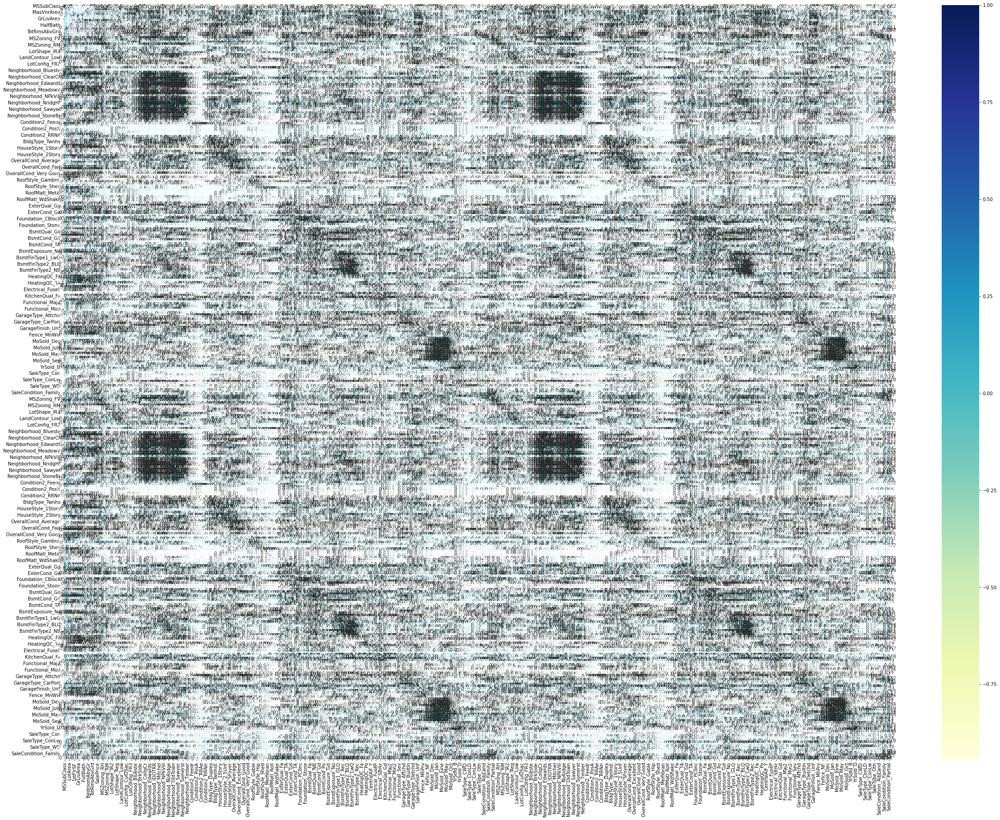

In [210]:
# Let's check the correlation coefficients to see which variables are highly correlated
plt.figure(figsize = (40, 30))
sns.heatmap(df_train.corr(), annot = True, cmap="YlGnBu")
plt.show()

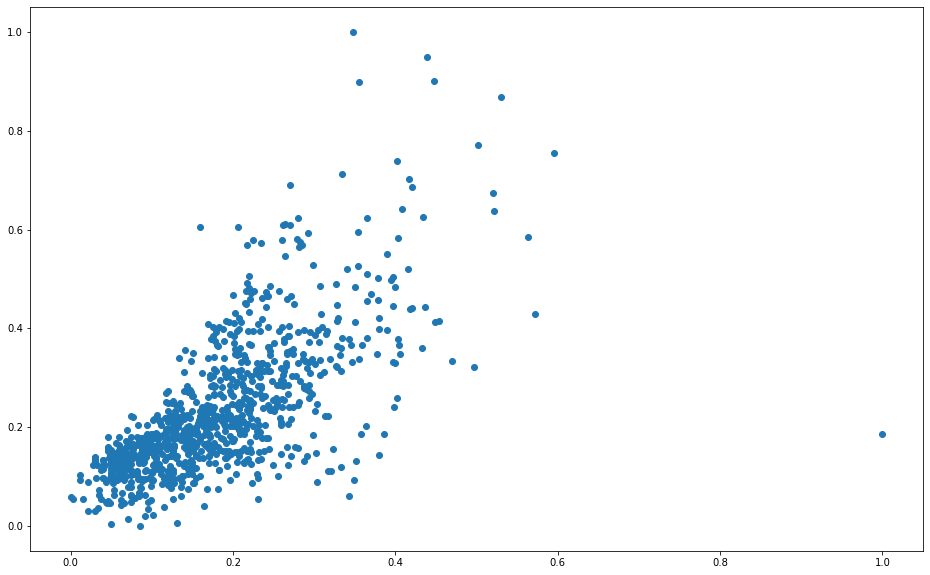

In [183]:
# lets see pairplot for SalePrice and GrLivArea
plt.figure(figsize = (16, 10))
plt.scatter(df_train.GrLivArea,df_train.SalePrice)
plt.show()

In [184]:
df_train.head()

,MSSubClass,LotFrontage,LotArea,MasVnrArea,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1277,0.352941,0.000000,0.077454,0.224375,0.294844,0.0,0.220454,1,1,1,...,0,0,0,0,1,0,0,0,1,0
770,0.382353,0.000000,0.027820,0.000000,0.089095,0.0,0.048150,1,1,0,...,0,0,0,0,1,0,0,0,1,0
667,0.000000,0.207668,0.031901,0.161250,0.284153,0.0,0.211500,1,2,0,...,0,0,0,0,1,0,0,0,1,0
1296,0.000000,0.255591,0.034588,0.092500,0.153243,0.0,0.101870,1,2,0,...,0,0,0,0,1,0,0,0,1,0
28,0.000000,0.150160,0.070210,0.000000,0.265384,0.0,0.195782,1,1,0,...,0,0,0,0,1,0,0,0,1,0


In [185]:
y_train = df_train.pop('SalePrice')
X_train = df_train
X_train.head()
X_train.shape

(959, 183)

### Building LR Models each highly correlated features  with sales price

In [186]:
#add a constant
import statsmodels.api as sm
X_train_sm=sm.add_constant(X_train['GrLivArea'])
#create first model
lr=sm.OLS(y_train,X_train_sm)
#fit
lr_model=lr.fit()
#params
lr_model.params
lr_model.summary()
X_train.shape
X_train_sm.shape


(959, 2)

In [187]:
#add another variable 
X_train_sm=X_train[['GrLivArea','LotArea']]
X_train_sm=sm.add_constant(X_train_sm)
#create second model
lr=sm.OLS(y_train,X_train_sm)
#fit
lr_model=lr.fit()
#params
lr_model.params
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.477
Method:                 Least Squares   F-statistic:                     437.9
Date:                Sat, 14 May 2022   Prob (F-statistic):          9.92e-136
Time:                        18:27:46   Log-Likelihood:                 854.52
No. Observations:                 959   AIC:                            -1703.
Df Residuals:                     956   BIC:                            -1688.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0572      0.007      8.485      0.000       0.044       0.070
GrLivArea      0.9142      0.033     27.688      0.000       0.849       0.979
LotArea        0.2130      0.060      3.527      0.000       0.094       0.331
==============================================================================
Omnibus:                      190.814   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3356.877
Skew:                           0.369   Prob(JB):                         0.00
Kurtosis:                      12.136   Cond. No.                         19.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [188]:
#add another variable 
X_train_sm=X_train[['GrLivArea','1stFlrSF','LotArea']]
X_train_sm=sm.add_constant(X_train_sm)
#create third model
lr=sm.OLS(y_train,X_train_sm)
#fit
lr_model=lr.fit()
#params
lr_model.params
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.537
Model:                            OLS   Adj. R-squared:                  0.536
Method:                 Least Squares   F-statistic:                     369.4
Date:                Sat, 14 May 2022   Prob (F-statistic):          3.38e-159
Time:                        18:27:50   Log-Likelihood:                 912.02
No. Observations:                 959   AIC:                            -1816.
Df Residuals:                     955   BIC:                            -1797.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0271      0.007      3.927      0.000       0.014       0.041
GrLivArea      0.7023      0.037     19.203      0.000       0.630       0.774
1stFlrSF       0.4389      0.040     11.030      0.000       0.361       0.517
LotArea        0.1008      0.058      1.744      0.081      -0.013       0.214
==============================================================================
Omnibus:                      298.379   Durbin-Watson:                   2.018
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11336.344
Skew:                          -0.701   Prob(JB):                         0.00
Kurtosis:                      19.785   Cond. No.                         20.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [189]:
Property.columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', '1stFlrSF',
       '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath',
       ...
       'SaleType_ConLI', 'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth',
       'SaleType_WD', 'SaleCondition_AdjLand', 'SaleCondition_Alloca',
       'SaleCondition_Family', 'SaleCondition_Normal',
       'SaleCondition_Partial'],
      dtype='object', length=184)

### Building LR model with all  feature variables



In [190]:
#build the model with all the variables
X_train_sm=sm.add_constant(X_train)
lr=sm.OLS(y_train,X_train_sm)
lr_model=lr.fit()
lr_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.923
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     53.17
Date:                Sat, 14 May 2022   Prob (F-statistic):               0.00
Time:                        18:27:57   Log-Likelihood:                 1771.4
No. Observations:                 959   AIC:                            -3189.
Df Residuals:                     782   BIC:                            -2327.
Df Model:                         176                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.3525      0.097     -3.636      0.000      -0.543      -0.162
MSSubClass                   -0.0431      0.029     -1.482      0.139      -0.100       0.014
LotFrontage                   0.0123      0.016      0.767      0.443      -0.019       0.044
LotArea                       0.1647      0.038      4.295      0.000       0.089       0.240
MasVnrArea                    0.0400      0.016      2.453      0.014       0.008       0.072
1stFlrSF                     -0.0456      0.260     -0.176      0.861      -0.556       0.464
2ndFlrSF                     -0.0739      0.111     -0.667      0.505      -0.292       0.144
GrLivArea                     0.7382      0.309      2.392      0.017       0.132       1.344
BsmtFullBath                  0.0118      0.004      2.980      0.003       0.004       0.020
FullBath                      0.0194      0.005      3.713      0.000       0.009       0.030
HalfBath                      0.0100      0.005      2.031      0.043       0.000       0.020
BedroomAbvGr                 -0.0124      0.003     -3.883      0.000      -0.019      -0.006
KitchenAbvGr                 -0.0613      0.016     -3.940      0.000      -0.092      -0.031
TotRmsAbvGrd                  0.0034      0.002      1.527      0.127      -0.001       0.008
Fireplaces                    0.0093      0.003      3.052      0.002       0.003       0.015
MSZoning_FV                   0.0359      0.037      0.973      0.331      -0.036       0.108
MSZoning_RH                   0.0496      0.038      1.296      0.195      -0.026       0.125
MSZoning_RL                   0.0404      0.035      1.153      0.249      -0.028       0.109
MSZoning_RM                   0.0396      0.034      1.177      0.240      -0.026       0.106
Street_Pave                   0.0925      0.037      2.475      0.014       0.019       0.166
LotShape_IR2                  0.0110      0.009      1.218      0.224      -0.007       0.029
LotShape_IR3                  0.0195      0.017      1.130      0.259      -0.014       0.053
LotShape_Reg                 -0.0027      0.004     -0.707      0.480      -0.010       0.005
LandContour_HLS               0.0181      0.013      1.399      0.162      -0.007       0.044
LandContour_Low              -0.0247      0.016     -1.533      0.126      -0.056       0.007
LandContour_Lvl               0.0045      0.010      0.456      0.649      -0.015       0.024
LotConfig_CulDSac             0.0162      0.007      2.241      0.025       0.002       0.030
LotConfig_FR2                -0.0171      0.009     -1.927      0.054      -0.035       0.000
LotConfig_FR3                -0.0411      0.029     -1.408      0.159      -0.098       0.016
LotConfig_Inside              0.0004      0.004      0.099      0.921      

In [191]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
107,BsmtCond_Po,inf
132,Electrical_Mix,inf
103,BsmtQual_NB,inf
106,BsmtCond_NB,inf
111,BsmtExposure_NB,inf
...,...,...
29,Neighborhood_Blueste,1.25
133,Electrical_NE,1.21
176,SaleType_Oth,1.08
55,Condition2_PosA,NaN


### Drop high VIF variables  to have the better fit

In [108]:
#Dropping the variable and updating the model
#As you can see from the summary and the VIF dataframe, some variables are still insignificant. One of these variables is, semi-furnished as it has a very high p-value of 0.938. Let's go ahead and drop this variables
# Dropping highly correlated variables and insignificant variables

#X_train = X_train.drop('Condition2_RRAn', 1,)

#X_train_sm = sm.add_constant(X_train)

#lr = sm.OLS(y_train, X_train_sm)
#lr_model=lr.fit()
#lr_model.summary()

In [192]:
print(lr_model.summary())
X_train.shape


                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.923
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     53.17
Date:                Sat, 14 May 2022   Prob (F-statistic):               0.00
Time:                        18:28:48   Log-Likelihood:                 1771.4
No. Observations:                 959   AIC:                            -3189.
Df Residuals:                     782   BIC:                            -2327.
Df Model:                         176                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

(959, 183)

In [124]:
# calculate VIF again
#vif = pd.DataFrame()
#vif['Features'] = X_train.columns
#vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
#vif['VIF'] = round(vif['VIF'], 2)
#vif = vif.sort_values(by = "VIF", ascending = False)
#vif

,Features,VIF
105,BsmtCond_NB,inf
130,Electrical_Mix,inf
102,BsmtQual_NB,inf
106,BsmtCond_Po,inf
114,BsmtFinType1_NB,inf
...,...,...
99,Foundation_Wood,1.26
29,Neighborhood_Blueste,1.25
131,Electrical_NE,1.21
174,SaleType_Oth,1.08


In [111]:
#Dropping the variable and updating the model
#As you can see from the summary and the VIF dataframe, some variables are still insignificant. One of these variables is, semi-furnished as it has a very high p-value of 0.938. Let's go ahead and drop this variables
# Dropping highly correlated variables and insignificant variables

#X_train = X_train.drop('BsmtExposure_NB',1,)

#X_train_sm = sm.add_constant(X_train)

#lr = sm.OLS(y_train, X_train_sm)
#lr_model=lr.fit()
#lr_model.summary()

#### Calculate VIF again .. Likewise the unsignificant variables of higher VIF and p can be droped. Do the iteration till getting the VIF<5 for the variables.

### Using RFE, the const and coefficents are -0.3525, 0.7382,0.0118 and 0.0194 for GrvLivAear, BsmtFullBath, FullBath

### Residual Analysis of the train data
#### So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like

In [197]:
y_train_price = lr_model.predict(X_train_sm)

Text(0.5, 0, 'Errors')

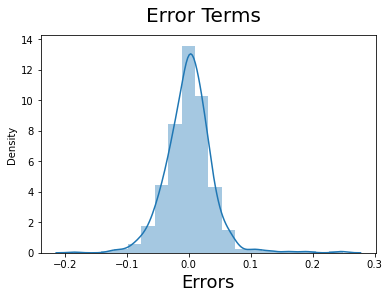

In [198]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_price), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

### Making predictions using the final model

Now that we have fitted the model and checked the normality of error terms, it's time to go ahead and make predictions using the final model. 

In [199]:
# Applying scaling on the test sets
num_vars = ['GrLivArea', '1stFlrSF', 'LotArea', 'BsmtFullBath', 'FullBath','Neighborhood_NPkVill', 'OverallCond_Good', 'ExterQual_Gd']

df_test[num_vars] = scaler.transform(df_test[num_vars])

In [200]:
df_test.describe()

,MSSubClass,LotFrontage,LotArea,MasVnrArea,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,412.000000,412.00000,412.000000,412.000000,412.000000,412.000000,412.000000,4.120000e+02,4.120000e+02,412.000000,...,412.000000,412.000000,412.000000,412.0,412.000000,412.0,412.000000,412.000000,412.000000,412.000000
mean,58.276699,57.38835,0.003091,110.932039,0.011763,399.825243,-0.064400,-6.076356e-03,6.210179e-07,0.444175,...,0.004854,0.004854,0.097087,0.0,0.859223,0.0,0.007282,0.016990,0.803398,0.101942
std,40.785370,33.99563,0.001597,190.239407,0.003782,461.265285,0.019173,1.104766e-11,2.227757e-07,0.516671,...,0.069588,0.069588,0.296437,0.0,0.348214,0.0,0.085124,0.129392,0.397912,0.302940
min,20.000000,0.00000,0.000447,0.000000,0.004471,0.000000,-0.103183,-6.076356e-03,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
25%,20.000000,40.00000,0.002375,0.000000,0.008862,0.000000,-0.077180,-6.076356e-03,3.906250e-07,0.000000,...,0.000000,0.000000,0.000000,0.0,1.000000,0.0,0.000000,0.000000,1.000000,0.000000
50%,60.000000,64.50000,0.002905,0.000000,0.011192,0.000000,-0.066644,-6.076356e-03,7.812500e-07,0.000000,...,0.000000,0.000000,0.000000,0.0,1.000000,0.0,0.000000,0.000000,1.000000,0.000000
75%,70.000000,79.00000,0.003540,172.500000,0.014117,755.250000,-0.056159,-6.076356e-03,7.812500e-07,1.000000,...,0.000000,0.000000,0.000000,0.0,1.000000,0.0,0.000000,0.000000,1.000000,0.000000
max,190.000000,160.00000,0.016068,1378.000000,0.032031,2065.000000,0.043460,-6.076356e-03,1.171875e-06,2.000000,...,1.000000,1.000000,1.000000,0.0,1.000000,0.0,1.000000,1.000000,1.000000,1.000000


### Dividing into X_test and y_test

In [201]:
y_test = df_test.pop('SalePrice')
X_test = df_test

In [205]:
# Adding constant variable to test dataframe
X_test_m = sm.add_constant(X_test)

In [203]:
# Creating X_test_m dataframe by dropping variables from X_test

#X_test_m = X_test.drop(["BsmtExposure_NB", "Condition2_RRAn"], axis = 1)
#X_test_m = X_test.drop(["Condition2_RRAn"], axis = 1)

In [207]:
y_pred_m = lr_model.predict(X_test_m)

### Model Evaluation
Let's now plot the graph for actual versus predicted values.

Text(0, 0.5, 'y_pred')

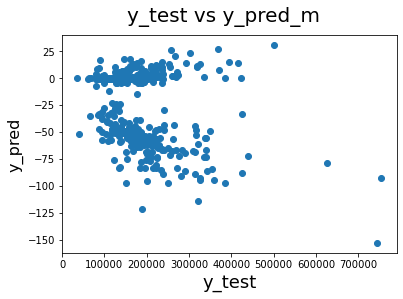

In [210]:
# Plotting y_test and y_pred to understand the spread

fig = plt.figure()
plt.scatter(y_test, y_pred_m)
fig.suptitle('y_test vs y_pred_m', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_pred', fontsize = 16)      

In [211]:
# find the value of R2 of the model
r2_score(y_test,y_pred_m)

-4.8835133359170975

Lets understand the plots of actual and predicted 


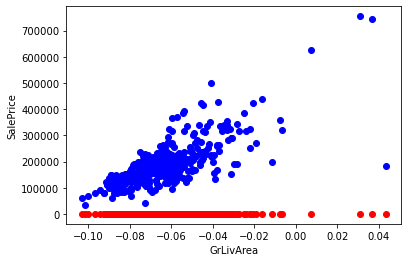

In [214]:
plt.scatter(X_test_m['GrLivArea'], y_test, color = 'blue') # for actual values
plt.scatter(X_test_m['GrLivArea'], y_pred_m, color = 'Red') # for pred values
plt.xlabel("GrLivArea")
plt.ylabel("SalePrice")
plt.show()

The predicted values are wrong as the regression need to be verified for other features too

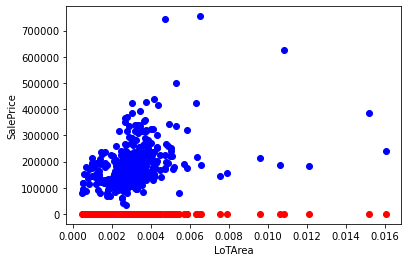

In [215]:
plt.scatter(X_test_m['LotArea'], y_test, color = 'blue') # for actual values
plt.scatter(X_test_m['LotArea'], y_pred_m, color = 'Red') # for pred values
plt.xlabel("LoTArea")
plt.ylabel("SalePrice")
plt.show()

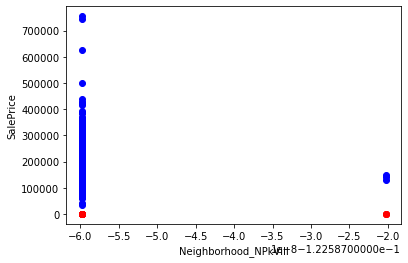

In [216]:
plt.scatter(X_test_m['Neighborhood_NPkVill'], y_test, color = 'blue') # for actual values
plt.scatter(X_test_m['Neighborhood_NPkVill'], y_pred_m, color = 'Red') # for pred values
plt.xlabel("Neighborhood_NPkVill")
plt.ylabel("SalePrice")
plt.show()

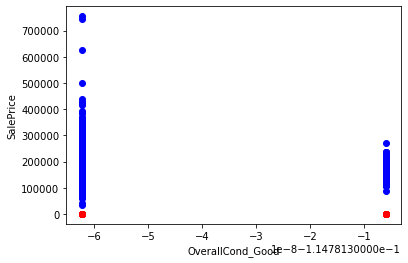

In [217]:
plt.scatter(X_test_m['OverallCond_Good'], y_test, color = 'blue') # for actual values
plt.scatter(X_test_m['OverallCond_Good'], y_pred_m, color = 'Red') # for pred values
plt.xlabel("OverallCond_Good")
plt.ylabel("SalePrice")
plt.show()

In [224]:
# Calculate beta coefficients -- Already calculated using RFE above
reg = LinearRegression()
reg.fit(X_test_m, y_test)
#print(reg.intercept)
#print(reg.coef)

LinearRegression()

In [226]:
print(reg.intercept_)
print(reg.coef_)

40098140680152.09
[ 2.51437208e+11 -3.57421317e+01  5.90399461e+01  2.50797175e+06
  2.30186230e+00 -6.52307219e+05 -6.99925827e+00  3.52614347e+06
  3.82543942e+14  4.18767730e+09  3.84480078e+03 -8.89847656e+03
  3.13779395e+03 -5.08434375e+03 -6.23041504e+02  1.63638553e+05
  5.45981702e+04  8.56409492e+04  7.92466484e+04 -7.19978340e+04
 -5.77376953e+03 -5.50257052e+10  5.24555078e+03 -2.97864453e+03
 -1.23064807e+04 -1.25105498e+04  1.37873892e+04 -1.39429619e+04
 -1.97276219e+04 -2.80388281e+03  3.83177671e+04  8.25842188e+03
 -5.09737500e+03 -1.95327578e+04 -1.42450322e+04 -1.54894206e+04
 -2.00191562e+04 -1.88868086e+04 -1.40632207e+04 -6.33502808e+03
 -2.53976653e+04 -1.67661211e+04  9.48359950e+11 -2.61494414e+04
  2.68323989e+04  1.21709141e+04 -2.77488086e+04 -4.56020527e+04
 -1.65364922e+04 -1.31450972e+04 -6.00386291e+04  2.57768906e+04
 -1.35557461e+04 -5.00657747e+04  8.67777637e+04  1.07739806e+05
 -3.88114895e+10 -3.86409873e+05 -1.29786372e+10  1.09042555e+05
  9.097

4.009e13, -1.9729e4, -5.09e3, 2.00e4 are the attribues for three features- GrvLivAear, BsmtFullBath, FullBath

#### Metrics to give the overal error in the model

In [227]:
rss=np.sum(np.sqaure(y_test - y_pred_m))
print(rss)
mse=mean_squared_error(y_test, y_pred_m)
print(mse)
rmse=mse**0.5
print(rmse)

AttributeError: module 'numpy' has no attribute 'sqaure'

Residual analysis can be done here also. 
#### To have better fit polynomial regression can be used for this data

### Ridge regression

Applying Ridge regression with varying hyper parameter lamda

In [231]:
# Applying Ridge Regression with varying the hyperparameter 'lambda'

X_seq = np.linspace(X_test_m.min(),X_test_m.max(),50).reshape(-1,1) # values to be considered for predictor variable
lambdas = [0, 0.001, 0.01, 0.1, 1, 10, 100, 1000] # Higher the value of lambda, 
                                                  # more the regularization
for i in lambdas: # for each lambda we get different model coefficients
    degree = 5 # Degree for polynomial regression - chose 5 since this is the lowest number that gave a perfect fit
    # Creating degree 5 features
    ridgecoef = PolynomialFeatures(degree)
    # Transforming input features to polynomial features (1, x1, x2, x3, x4, x5)    
    X_poly = ridgecoef.fit_transform(X_test)
    ridgereg = Ridge(alpha = i) # Initialize the Ridge Regression model with a specific lambda
    ridgereg.fit(X_poly, y_test) # fit the model on the polynomial features
    
    # Plotting the ridge regression model for each lambda
    plt.figure()
    plt.scatter(X_test,y_test)
    plt.plot(X_seq,ridgereg.predict(ridgecoef.fit_transform(X_seq)),color="black") # Polynomial Regression
    plt.plot(X_seq,reg.predict(X_seq),color="red") # Linear Regression
    plt.title("Polynomial regression with degree "+str(degree) + " and lambda = " + str(i))
    plt.show()
    
    #Computing the r2 score
    y_pred = ridgereg.predict(ridgecoef.fit_transform(X_test))
    print("r2 score = " + str(r2_score(y_test, y_pred))) 
    print(ridgereg.coef_) # model coefficients


MemoryError: Unable to allocate 5.56 TiB for an array with shape (412, 1854900872) and data type float64

### Lasso Regression

In [232]:
# Applying Lasso Regression with varying the hyperparameter 'lambda'

lambdas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
for i in lambdas:
    degree = 5
    # Creating degree 5 features
    lassocoef = PolynomialFeatures(degree)
    # Transforming input features to polynomial features (1, x1, x2, x3, x4, x5)
    X_poly = lassocoef.fit_transform(X_test)
    lassoreg = Lasso(alpha = i)
    lassoreg.fit(X_poly, y_test)
    # Plotting the ridge model
    plt.figure()
    plt.scatter(X_test,y_test)
    plt.plot(X_seq,lassoreg.predict(lassocoef.fit_transform(X_seq)),color="black")
    plt.plot(X_seq,reg.predict(X_seq),color="red")
    plt.title("Polynomial regression with degree "+str(degree) + " and lambda = " + str(i))
    plt.show()
    # Compute R^2 
    y_pred = lassoreg.predict(lassocoef.fit_transform(X_test))
    print("r2 score = " + str(r2_score(y_test, y_pred)))
    print(lassoreg.coef_)

MemoryError: Unable to allocate 5.56 TiB for an array with shape (412, 1854900872) and data type float64